# Group4_PythonCode
---

**Dibuat oleh:** 

- Dennis Jonathan (23101910027)
- Gavrila Blenda (23101910031)
- Sherina Jakfar (23101910036)
- Steffi Victoria Yahya (23101910037)
- Irwin  Budianto (23101910051)

**Kelompok 4 - Pariwisata** 

*S1 Business Mathematics 2019 - Universitas Prasetiya Mulya*

Di kesempatan ini, kelompok kami akan mencoba untuk mengimplementasikan regresi linear ganda di bidang **Pariwisata**, oleh sebab itu kami akan memprediksi jumlah tamu yang mengunjungi hotel-hotel berbintang di provinsi-provinsi di Indonesia. Data-data tersebut diambil dari kategori **Pariwisata** di situs [BPS](https://www.bps.go.id/subject/16/pariwisata.html) dan dikumpulkan menjadi satu menggunakan fitur [tabel dinamis](https://www.bps.go.id/subject/16/pariwisata.html#subjekViewTab5).

Ada beberapa kolom yang kami pilih sebagai data yang digunakan. Kolom-kolom tersebut adalah:
- `Provinsi` - provinsi tempat data diambil.
- `Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)` - mean durasi inap tamu di hotel berbintang dengan satuan malam.
- `Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen)` - persentase kapasitas hotel yang terisi.
- `Jumlah Tempat Tidur Hotel Bintang` - total jumlah tempat tidur yang ditawarkan di hotel berbintang di provinsi.
- `Jumlah Kamar Tidur Hotel Bintang` - total jumlah kamar tidur yang ditawarkan di hotel berbintang di provinsi.
- `Jumlah Akomodasi Hotel Bintang` - total jumlah akomodasi berbintang di provinsi.
- `Kepadatan Penduduk menurut Provinsi (jiwa/km2)` - jumlah penduduk di provinsi per kilometer kuadrat.
- `Jumlah Perjalanan Wisatawan Nusantara (Orang)` - jumlah perjalanan yang dilakukan wisatawan di nusantara dengan satuan orang.
- `Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)` - total tamu domestik yang menginap di hotel berbintang dengan satuan ribuan orang.
- `Jumlah Tamu Asing pada Hotel Bintang (Ribu Orang)` - total tamu internasional yang menginap di hotel berbintang dengan satuan ribuan orang.
- `tahun` - tahun data diambil.

Semua data kecuali `Kepadatan Penduduk menurut Provinsi (jiwa/km2)`(data tersebut diambil dari bagian **Kependudukan**) diambil dari **Pariwisata**. Analisa tersebut akan kami lakukan dengan bahasa pemrograman **Python** melalui bantuan situs [Deepnote](deepnote.com). Kami akan menggunakan variabel dependen yang bernama `Jumlah Tamu Total pada Hotel Bintang`, atau hasil jumlah dari `Jumlah Perjalanan Wisatawan Nusantara (Orang)` dan `Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)`. Data yang kami gunakan juga merupakan gabungan dari data tahun 2016 dan 2019 dikarenakan kebanyakan data yang digunakan sebagai kolom dari bagian **Pariwisata** di situs **BPS** memiliki dua tahun yang sama yaitu tahun 2016 dan 2019. Selain itu juga, karena ketentuan untuk menggunakan $n=30$, menggabung kedua tahun tersebut merupakan sebuah ide yang baik untuk meminimalisir data yang terpotong akibat tergolong *outlier*.

## 1. Pendahuluan

### 1.A. Menginstall *Libraries* di Python
Karena ada beberapa *libraries* yang tidak tersedia secara langsung di situs **Deepnote**, kami perlu menggunakan fungsi `!pip install` untuk mengunduh dan menginstall *libraries* yang tidak ada di dalam *virtual machine* yang kami gunakan. Langkah ini merupakan langkah yang bersifat opsional.

In [1]:
# Installing libraries
!pip install statsmodels
!pip install openpyxl
!pip install xlrd

### 1.B. Mengimpor *Libraries*
Setelah melakukan `!pip install`, kami akan mengimpor *libraries* yang diperlukan ke dalam area kerja yang kami gunakan. Secara umum, ada tiga kategori *library* yang kami gunakan yaitu *library* untuk memproses dan mengolah data, *library* untuk melakukan analisa grafis, dan yang terakhir ada *library* untuk melakukan pemodelan.

Setting `%matplotlib inline` digunakan agar semua grafik yang telah dimunculkan akan terlihat di area kerja yang kami gunakan sekaligus juga menyimpan grafik-grafik yang telah kami buat.

In [2]:
# Importing libraries
import pandas as pd
import numpy as np
from scipy.stats import zscore

# Importing libraries to plot
import seaborn as sns
import matplotlib.pyplot as plt

# Importing functions for scikitlearn
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

# Importing functions from statsmodels 
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Preventing warning pop ups
import warnings
warnings.filterwarnings('ignore')

# Matplotlib settings
%matplotlib inline

### 1.C. Mengimpor Dataset ke Python
Langkah selanjutnya adalah mengimpor data yang akan kami gunakan. Data tersebut bernama `Group4_DataSet.xlsx` dan menggunakan format file excel, sehingga untuk memasukan data tersebut ke dalam area kerja, kami akan menggunakan fungsi `pd.read_excel`. Kami juga menggunakan `df.drop()` untuk menghilangkan sebuah kolom tanpa nama yang muncul secara tiba-tiba. Kolom tersebut sebenarnya merupakan tiruan dari indeks data yang digunakan.

Setelah mengimpor data, kami akan menunjukan $5$ data pertama menggunakan `df.head()`.

In [3]:
# Importing the data
df=pd.read_excel('dataset.xlsx')
df.drop('Unnamed: 0',axis=1,inplace=True)

# Previewing the data
df.head()

,Provinsi,Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam),Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen),Jumlah Tempat Tidur Hotel Bintang,Jumlah Kamar Tidur Hotel Bintang,Jumlah Akomodasi Hotel Bintang,Kepadatan Penduduk menurut Provinsi (jiwa/km2),Jumlah Perjalanan Wisatawan Nusantara (Orang),Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang),Jumlah Tamu Asing pada Hotel Bintang (Ribu Orang),tahun
0,ACEH,1.69,46.03,2579,1503,20,88,4306217,393.68,24.34,2016
1,SUMATERA UTARA,1.56,54.19,16418,10732,116,193,9398998,3608.04,311.48,2016
2,SUMATERA BARAT,1.46,54.32,6015,3653,61,125,5019290,1649.82,81.27,2016
3,RIAU,1.69,48.51,7832,5206,58,75,5076197,1543.12,33.13,2016
4,JAMBI,1.85,48.20,2885,2187,31,69,1774454,634.65,4.05,2016


### 1.D. Memunculkan Dimensi dari Data
Kami akan memunculkan dimensi dari data yang kami gunakan. Salah satu cara untuk memunculkan dimensi dari data adalah menggunakan `df.shape` dengan `df.shape[0]` melambangkan jumlah baris dan `df.shape[1]` melambangkan jumlah kolom.

In [4]:
# Previewing the data dimension
print('The data has {p1} rows and {p2} columns'.format(p1=df.shape[0],p2=df.shape[1]))

The data has 68 rows and 11 columns


## 2. Membersihkan Data

### 2.A. Menunjukan Tipe Data Setiap Kolom
Sebelum kami melakukan pembersihan data, kami perlu tahu tipe data dari setiap kolom yang kami miliki, untuk itu kami menggunakan `df.info()` supaya dapat memunculkan tipe data dari $11$ kolom yang ada di dalam data kami.

In [5]:
# Checking the object types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 11 columns):
 #   Column                                                                 Non-Null Count  Dtype  
---  ------                                                                 --------------  -----  
 0   Provinsi                                                               68 non-null     object 
 1   Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)                68 non-null     object 
 2   Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen)  68 non-null     float64
 3   Jumlah Tempat Tidur Hotel Bintang                                      68 non-null     int64  
 4   Jumlah Kamar Tidur Hotel Bintang                                       68 non-null     int64  
 5   Jumlah Akomodasi Hotel Bintang                                         68 non-null     int64  
 6   Kepadatan Penduduk menurut Provinsi (jiwa/km2)                         68 non-null     int64

### 2.B. Mengubah Data Objek Menjadi Float
Seperti yang dapat dilihat, ada beberapa kolom yang tidak memiliki tipe data yang sesuai dengan yang kami inginkan. Kolom-kolom tersebut adalah:

1. `Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen)`
2. `Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)`

Kedua kolom tersebut memiliki masalah yang sama yaitu penggunaan ',' dan '.' yang tidak konsisten saat melakukan penulisan angka desimal. Selain itu, kolom `Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)` juga menggunakan spasi untuk separator angka. Untuk itu, kami akan mengubah karakter ',' menjadi '.' dan untuk kolom `Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)` kami juga mengubah spasi menjadi karakter kosong. Setelah itu, kami akan mengubah tipe data menjadi float.


In [6]:
# Converting object types into floats
df['Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)']=df['Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)'].astype(str).str.replace(',','.').str.replace(r'\s','').astype(float)
df['Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)']=df['Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)'].astype(str).str.replace(',','.').astype(float)

### 2.C. Mengganti Nama Kolom
Nama kolom yang ada di *dataset* yang asli dapat dibilang cukup panjang, oleh sebab itu kami akan mengubah nama-nama kolom yang kami nilai panjang menjadi nama yang lebih pendek namun tetap representatif terhadap kolom tersebut. Kolom-kolom yang diganti adalah:
- `Jumlah Tamu Asing pada Hotel Bintang (Ribu Orang)` --> `jumlah tamu asing`
- `Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)` --> `mean lama inap tamu(malam)`
- `Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen)` --> `persen tingkat huni kamar`
- `Jumlah Tempat Tidur Hotel Bintang` --> `jumlah tempat tidur` 
- `Jumlah Kamar Tidur Hotel Bintang` --> `jumlah kamar tidur`
- `Jumlah Akomodasi Hotel Bintang` --> `jumlah akomodasi`
- `Kepadatan Penduduk menurut Provinsi (jiwa/km2)` --> `kepadatan penduduk (jiwa/km2)`
- `Jumlah Perjalanan Wisatawan Nusantara (Orang)` --> `jumlah perjalanan wisatawan nusantara`
- `Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)` --> `jumlah tamu lokal`

Selain mengganti nama kolom, kami juga mengganti nama kolom yang ada menjadi huruf kecil. Untuk melakukan kedua hal tersebut, kami akan menggunakan fungsi `df.rename()` dengan setting parameter `inplace=True`.

In [7]:
# Checking the column names
df.columns

Index(['Provinsi', 'Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)',
       'Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen)',
       'Jumlah Tempat Tidur Hotel Bintang', 'Jumlah Kamar Tidur Hotel Bintang',
       'Jumlah Akomodasi Hotel Bintang',
       'Kepadatan Penduduk menurut Provinsi (jiwa/km2)',
       'Jumlah Perjalanan Wisatawan Nusantara (Orang)',
       'Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)',
       'Jumlah Tamu Asing pada Hotel Bintang (Ribu Orang)', 'tahun'],
      dtype='object')

In [8]:
# Renaming the columns
df.rename(columns = {
                    'Jumlah Tamu Asing pada Hotel Bintang (Ribu Orang)':'jumlah tamu asing',
                    'Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)':'mean lama inap tamu(malam)',
                    'Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen)':'persen tingkat huni kamar',
                    'Jumlah Tempat Tidur Hotel Bintang':'jumlah tempat tidur', 
                    'Jumlah Kamar Tidur Hotel Bintang':'jumlah kamar tidur',
                    'Jumlah Akomodasi Hotel Bintang':'jumlah akomodasi',
                    'Kepadatan Penduduk menurut Provinsi (jiwa/km2)':'kepadatan penduduk (jiwa/km2)',
                    'Jumlah Perjalanan Wisatawan Nusantara (Orang)':'jumlah perjalanan wisatawan nusantara',
                    'Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)':'jumlah tamu lokal'
                    }, inplace = True)

# Converting column names into lower case
df.rename(columns=str.lower,inplace = True)

### 2.D. Membentuk Kolom Target
Setelah kami mengubah nama kolom, kami akan membuat kolom target sesuai dengan ide yang ditulis di awal, yaitu hasil tambah dari `jumlah tamu asing` dan `jumlah tamu lokal`. Sebelum kami menambah kedua kolom tersebut, kami akan mengalikan kedua kolom tersebut dengan $1,000$ karena kedua kolom tersebut memiliki satuan asli yaitu 'ribuan orang'. Setelah kolom target terbentuk, kami akan menghilangkan kedua kolom yang asli untuk menurunkan resiko multikolinear.

In [9]:
# Multiplying some columns into thousands
for i in ['jumlah tamu asing','jumlah tamu lokal']:
    df[i]=df[i]*1000

# Adding 'jumlah tamu lokal' and 'jumlah tamu asing' to create 'jumlah tamu total'
df['jumlah tamu total']=(df['jumlah tamu lokal']+df['jumlah tamu asing']).astype(int)
df.drop(['jumlah tamu lokal','jumlah tamu asing'],axis=1,inplace=True)

### 2.E. Menunjukan Data
Perubahan-perubahan yang telah dilakukan di atas perlu di cek supaya semua hal berjalan sesuai dengan apa yang kita harapkan. Untuk itu, kami akan menggunakan kembali fungsi `df.head()`.

In [10]:
# Previewing of the data
df.head()

,provinsi,mean lama inap tamu(malam),persen tingkat huni kamar,jumlah tempat tidur,jumlah kamar tidur,jumlah akomodasi,kepadatan penduduk (jiwa/km2),jumlah perjalanan wisatawan nusantara,tahun,jumlah tamu total
0,ACEH,1.69,46.03,2579,1503,20,88,4306217,2016,418020
1,SUMATERA UTARA,1.56,54.19,16418,10732,116,193,9398998,2016,3919520
2,SUMATERA BARAT,1.46,54.32,6015,3653,61,125,5019290,2016,1731090
3,RIAU,1.69,48.51,7832,5206,58,75,5076197,2016,1576250
4,JAMBI,1.85,48.20,2885,2187,31,69,1774454,2016,638700


## 3. Eksplorasi Data

### 3.A. Statistika Deskriptif
Kita akan memulai bagian eksplorasi data dengan cara melihat statistika deskriptif dari data yang kami miliki. Statistika deskriptif yang dapat di cek berupa:

1. Jumlah Data
2. Rata-rata 
3. Deviasi Standar
4. Data minimum
5. Kuartil $1$-$3$
6. Data maksimum

Kita dapat menggunakan fungsi `df.describe()` untuk memunculkan statistika deskriptif dengan mudah.

In [11]:
# Descriptive statistics
df.describe().drop('tahun',axis=1)

,mean lama inap tamu(malam),persen tingkat huni kamar,jumlah tempat tidur,jumlah kamar tidur,jumlah akomodasi,kepadatan penduduk (jiwa/km2),jumlah perjalanan wisatawan nusantara,jumlah tamu total
count,68.000000,68.000000,68.000000,68.000000,68.000000,68.000000,6.800000e+01,6.800000e+01
mean,1.739706,51.290000,13041.014706,8775.823529,86.808824,730.750000,8.047991e+06,2.353951e+06
std,0.294071,7.108257,19393.436979,13686.189647,112.729932,2653.019797,1.228440e+07,3.166043e+06
min,1.260000,36.070000,492.000000,313.000000,3.000000,9.000000,4.915310e+05,6.952000e+04
25%,1.552500,46.595000,1937.000000,1294.500000,18.750000,48.500000,1.907504e+06,3.148575e+05
50%,1.680000,50.580000,5386.000000,3618.500000,42.000000,101.000000,3.206628e+06,9.136050e+05
75%,1.855000,56.177500,15981.500000,9625.000000,93.250000,251.250000,7.764839e+06,2.978440e+06
max,2.910000,71.120000,97099.000000,70146.000000,507.000000,15900.000000,5.208172e+07,1.335323e+07


### 3.B. Pairplot dari Data
Setelah melihat statistika deskriptif dari data, kami akan menggunakan `sns.pairplot()` untuk melihat korelasi antar kolom serta distribusi dari kolom tersebut di diagonal atau posisi **\[i,i\]** menggunakan *kernel density estimatation*.

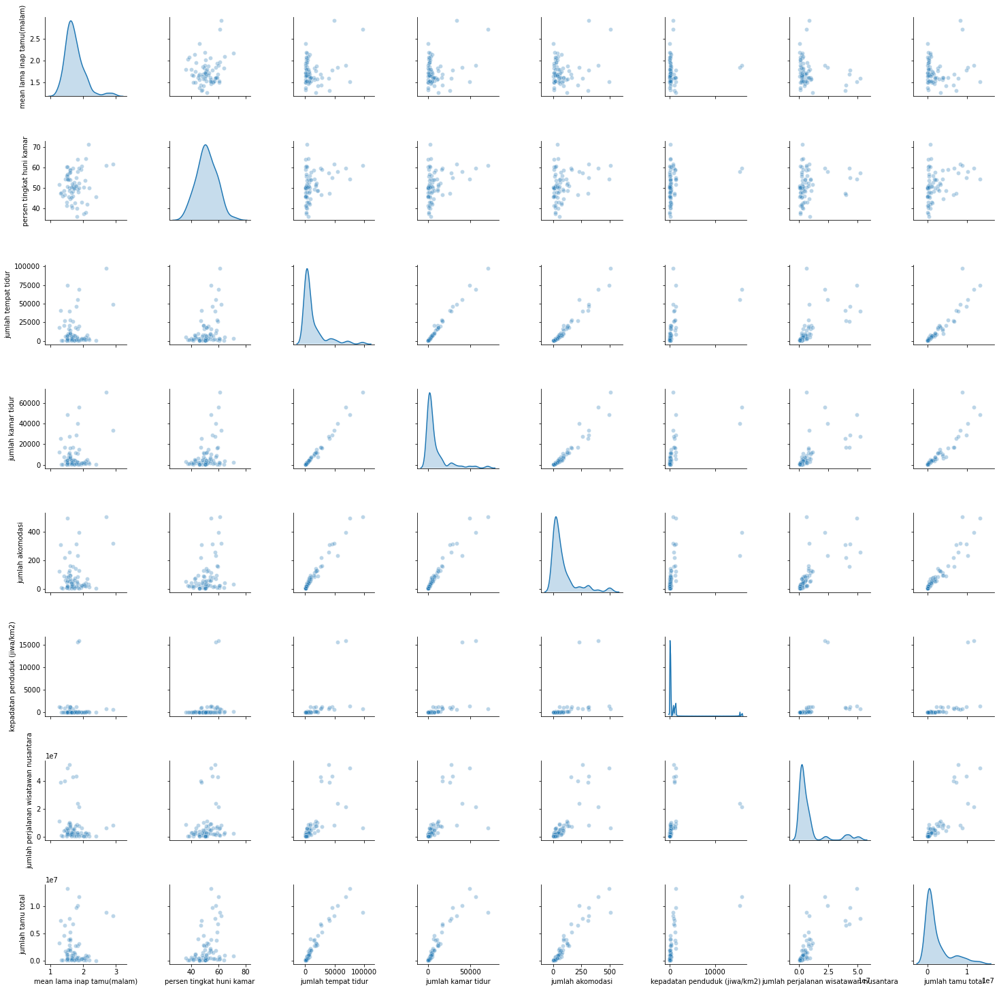

In [12]:
# Using pairplot to see the correlation and distribution of the data
sns.pairplot(data=df.drop(['tahun'],axis=1),
            plot_kws={'alpha':0.3},diag_kind='kde')
sns.despine()

### 3.C. Normal *Quantile-Quantile* Plot
Normal QQ-plot adalah sebuah *scatter plot* yang digunakan untuk mengecek apakah suatu distribusi sample mengikuti sebuah distribusi tertentu dan pada kali ini peneliti mengecek apakah distribusi data mengikuti distribusi normal. Apabila persebaran titik-titik mengikuti garis refrensi, maka dapat dikatakan bahwa data yang dimiliki berdistribusi normal. Untuk bisa mencari QQ-plot, kami menggunakan fungsi `sm.qqplot()` dari *library* `statsmodels.api`.

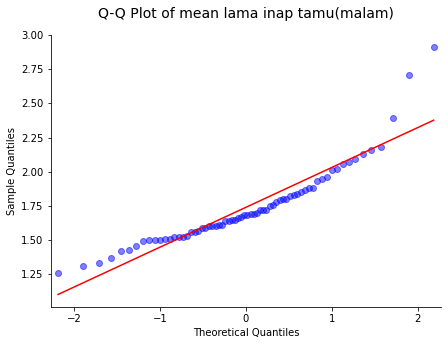

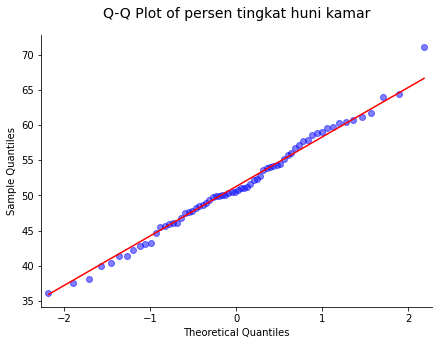

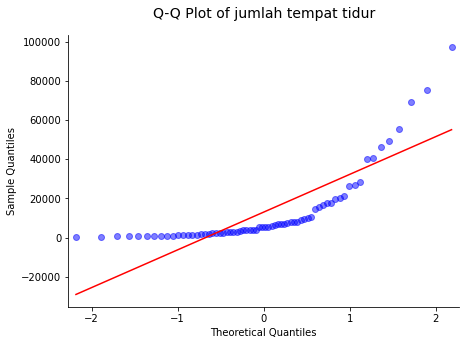

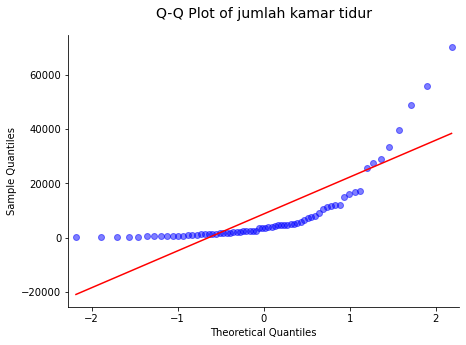

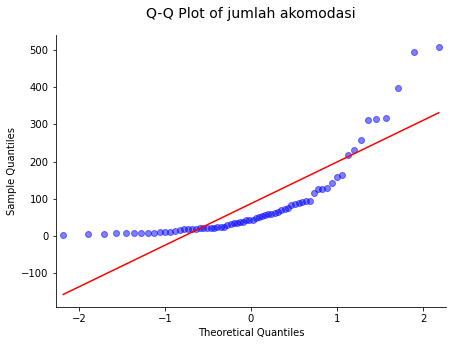

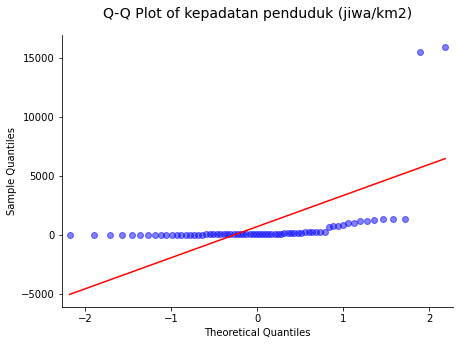

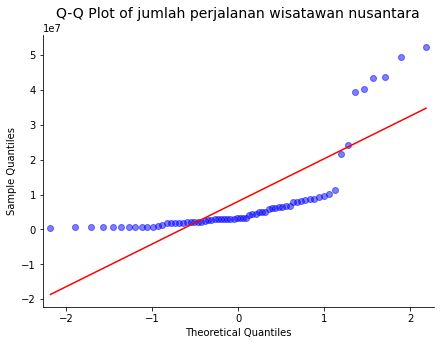

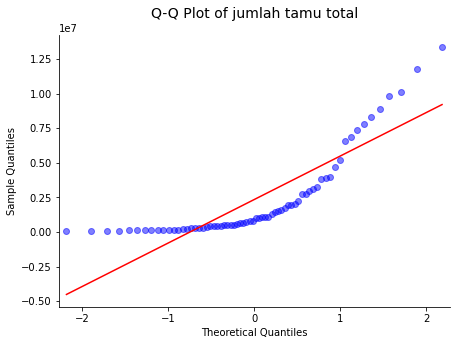

In [13]:
for i in df.columns.drop(['provinsi','tahun']).tolist():
    # Plotting a qqplot
    fig, (ax1) = plt.subplots(1,1,figsize=(7,5))
    sm.qqplot(df[i],line='s',ax=ax1,alpha=0.5)

    # Plot settings
    plt.title('Q-Q Plot of {}'.format(i),fontsize=14,y=1.04)
    sns.despine()

### 3.D. Boxplot
Penggunaan boxplot di dalam menganalisa data yang digunakan sangatlah penting. Boxplot membantu kita untuk menggambarkan rentang dari data yang kita miliki, oleh sebab itu, data yang kita anggap sebagai *outliers* akan terlihat dengan jelas. Untuk memunculkan *boxplot* kami menggunakan fungsi `sns.boxplot()` dari *library* `seaborn`.

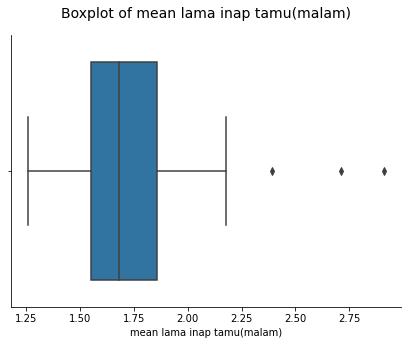

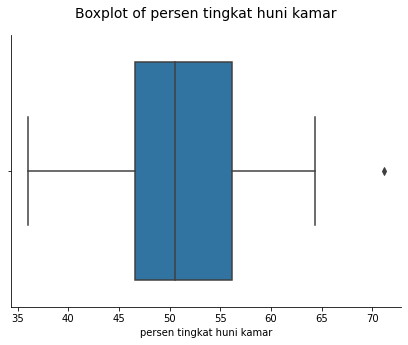

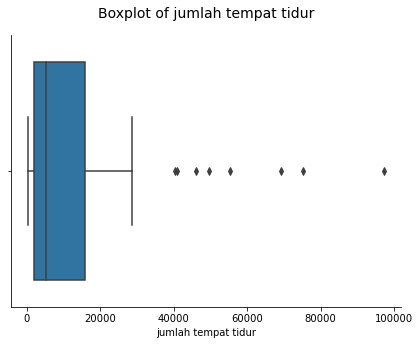

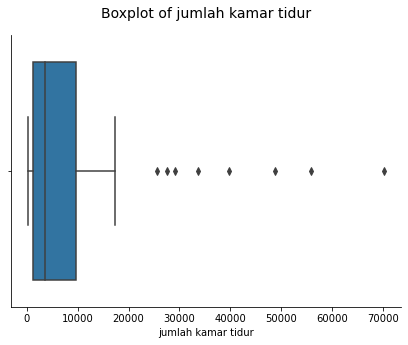

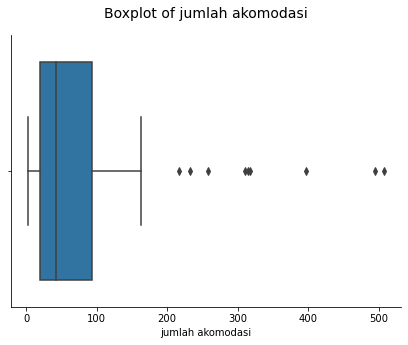

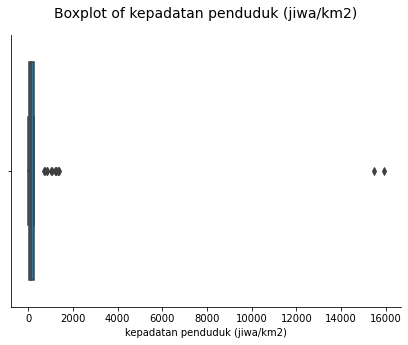

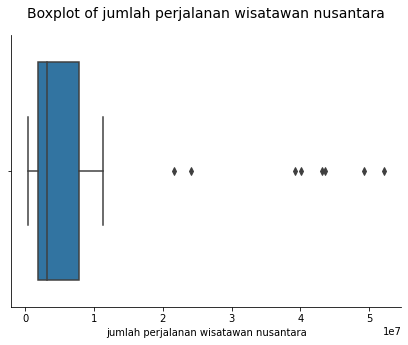

In [14]:
for i in df.columns.drop(['provinsi', 'jumlah tamu total','tahun']).tolist():
    # Plotting boxplot
    plt.figure(figsize=(7,5))
    sns.boxplot(data=df,x=i)

    # Plot settings
    plt.title('Boxplot of {}'.format(i),fontsize=14,y=1.04)
    plt.xlabel(i)
    sns.despine()

### 3.E. Menghilangkan *Outliers* Menggunakan *Z-Scores*
Selanjutnya kami akana menghilangkan *outliers* dengan menggunakan *Z-Scores*. Langka pertama yang dilakukan adalah mencari ekuivalen nilai Z untuk semua data numerik yang dimiliki. Setelah itu kita akan membuat *boolean mask* untuk nilai Z yang berada dibawah $3$ (karena di dalam distribusi normal, $3$ kali deviasi standar dapat disebut sebagai *outlier* dan di normal baku, nilai deviasi standar adalah $1$). Setelah itu kami akan menghilangkan data yang memiliki nilai *boolean False*.

In [15]:
# Calculating the zscores
z_scores = zscore(df.select_dtypes([np.number]))

# Dropping outliers which is 3 times the standard deviation in normal distribution
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
df = df[filtered_entries]

### 3.F. Melakukan Pengskalaan Menggunakan Normal Baku
Pengskalaan adalah suatu hal yang dapat dilakukan saat mempersiapkan data yang digunakan sebelum melakukan pemodelan. Hal ini dilakukan supaya model yang kita miliki nanti lebih tidak sensitif terhadap perubahan variabel input/independen. Kami akan menggunakan `StandardScaler()` dari `sklearn.preprocessing` untuk mempercepat proses pengskalaan data yang kami gunakan.

In [16]:
# create a scaler object for standard scaling
std_scaler = StandardScaler()

# standard scaling some columns
for i in df.columns.drop(['provinsi', 'jumlah tamu total','tahun']).tolist():
    df[i]=std_scaler.fit_transform(df[[i]])

### 3.G. Korelasi dan *Heatmap*
Sebelum melakukan pemodelan, kita juga dapat melihat korelasi dari kolom yang kita miliki terhadap kolom target yaitu `jumlah tamu total`. Karena kita tidak memerlukan tanda positif dan negatif dari kolom-kolom tersebut, kami menggunakan nilai absolut dari korelasi. Semua hal ini dapat dilakukan dengan mudah menggunakan `df.corr()['target'].abs()`. Setting `.drop(['target])` merupakan opsi untuk membuang nilai korelasi kolom target dengan dirinya sendiri karena kita mengetahui bahwa nilai adalah 1.

In [17]:
# Finding the correlation of the columns to target
df.corr()['jumlah tamu total'].abs().drop(['jumlah tamu total'])

mean lama inap tamu(malam)               0.311392
persen tingkat huni kamar                0.172865
jumlah tempat tidur                      0.968186
jumlah kamar tidur                       0.956649
jumlah akomodasi                         0.948192
kepadatan penduduk (jiwa/km2)            0.763907
jumlah perjalanan wisatawan nusantara    0.871394
tahun                                    0.074798
Name: jumlah tamu total, dtype: float64

*Heatmap* juga merupakan salah satu visualisasi yang bagus untuk menunjukan korelasi dari setiap kolom dengan kolom lainnya. Fungsi `sns.heatmap()` merupakan solusi cepat untuk visualisasi *heatmap*. Warna yang lebih terang menunjukan korelasi yang lebih tinggi. Sebaliknya, warna gelap menunjukan korelasi yang lebih rendah. Kita juga melakukan *mask* untuk menutup korelasi $Corr(i,i)$ dan korelasi yang sama (misalnya $Corr(p,q)=Corr(q,p)$)

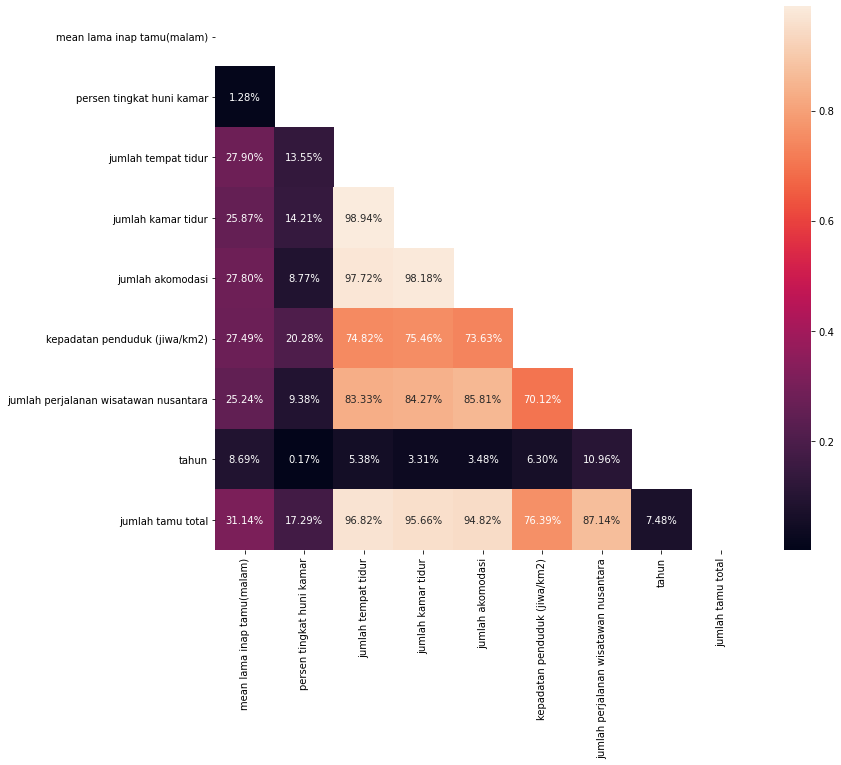

In [18]:
# Plotting heatmap of absolute correlation for the columns
plt.figure(figsize=(12,10))
mask = np.triu(np.ones_like(df.corr().abs(), dtype=np.bool))
sns.heatmap(df.corr().abs(),annot=True,fmt='.2%',mask=mask)

### 3.H. Menyampel $30$ Data
Langkah terakhir dari eksplorasi data adalah menyampel $30$ data sesuai dengan persyaratan dari projek. Untuk melakukan ini, kami menggunakan `df.sample()` dengan `random_state=0` untuk memastikan data yang kami sampel dapat dihasilkan kembali setiap saat. Setelah menyampel $30$ data, kami menggunakan `df.head()` untuk menunjukan $5$ data hasil sampel.

In [19]:
# Sampling 30 data
df=df.sample(30,random_state=0)

# Previewing the data
df.head()

,provinsi,mean lama inap tamu(malam),persen tingkat huni kamar,jumlah tempat tidur,jumlah kamar tidur,jumlah akomodasi,kepadatan penduduk (jiwa/km2),jumlah perjalanan wisatawan nusantara,tahun,jumlah tamu total
32,PAPUA BARAT,2.044258,-0.089867,-0.685759,-0.692601,-0.685408,-0.617796,-0.579439,2016,171950
34,ACEH,1.049339,-1.065067,-0.515407,-0.552953,-0.562545,-0.388842,0.047597,2019,321940
35,SUMATERA UTARA,-0.594440,-0.246878,1.290206,1.061976,1.080750,-0.097200,0.418462,2019,2937970
54,KALIMANTAN TENGAH,-0.810726,0.883892,-0.606150,-0.606152,-0.623976,-0.593265,-0.426597,2019,402960
57,KALIMANTAN UTARA,-1.459586,-0.644449,-0.785557,-0.807478,-0.823629,-0.615070,-0.570685,2019,77710


## 4. Modelling

### 4.A. Mendefinisikan Beberapa Fungsi
Sebelum melakukan pemodelan, kami akan mendefinisikan tiga fungsi, fungsi-fungsi tersebut adalah:

1. `calc_vif` - fungsi yang digunakan untuk menghitung *Variance Inflation Factor* (VIF) dari kolom-kolom yang dimiliki dengan menggunakan fungsi `variance_inflation_factor` dari `statsmodels.stats.outliers_influence`.
2. `calc_pval` - fungsi yang digunakan untuk menghitung $P>|t|$ atau *P-Value* dari setiap parameter model. Kita akan menggunakan fungsi `sm.OLS` diikuti dengan `model.pvalues` dari *library* `statsmodels.api` untuk menghitung *P-Value*
3. `vif_p_eliminate` - fungsi yang digunakan untuk terlebih dahulu melakukan eliminasi kolom-kolom yang memiliki nilai VIF lebih dari suatu batas yang kita tentukan dan selanjutnya mengeliminasi kolom dengan $P>|t|$ lebih besar dari nilai $\alpha$ yang ditentukan.

Fungsi ketiga akan menggunakan kedua fungsi sebelumnya. Eliminasi *Variance Inflation Factor* (VIF) dilakukan untuk mengurangi resiko dari multikolinearitas, sementara eliminasi kolom dengan $P>|t|$ lebih besar dari nilai $\alpha$ memastikan bahwa model ynag dihasilkan representatif untuk data populasi.

In [20]:
# Defining a function to measure VIF
def calc_vif(x):
    vif = pd.DataFrame()
    vif['Var']=x.columns
    vif['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return vif

In [21]:
# Defining a function to measure p_value
def calc_pval(data):
    x=sm.add_constant(data)
    y=df['jumlah tamu total']
    LR = sm.OLS(y,x)
    model = LR.fit()
    tempd=pd.DataFrame(model.pvalues,columns=['p_val']).drop('const')
    return tempd

In [22]:
# Defining a function which eliminates features based on VIF and P-value
def vif_p_eliminate(data,vif_tres=5,alpha=0.05):
    # Calculating VIF ot the data
    temp_vif=calc_vif(data)
    
    # Recursively removing columns with VIF>vif_tres
    while temp_vif['VIF'].max()>vif_tres:
        temp_vif=temp_vif.loc[temp_vif['VIF']!=temp_vif['VIF'].max()]
        index=temp_vif['Var'].to_list()
        temp_vif=calc_vif(data[index])

    # Getting feature from VIF elimination
    feature_p=temp_vif['Var'].to_list()

    # Calculating p-values
    temp_p=calc_pval(data[feature_p])

    # Recursively removing features with p_values higher than alpha
    while temp_p['p_val'].max()>alpha:
        temp_p=temp_p.loc[temp_p['p_val']!=temp_p['p_val'].max()]
        temp_feat=temp_p.index.tolist()
        temp_p=calc_pval(data[temp_feat])

    # Previewing the result of both calculation
    temp_p.reset_index(inplace=True)
    temp_p.rename(columns={'index':'Var'},inplace=True)
    temp_p=temp_p.merge(temp_vif,on='Var')
    display(temp_p)
    
    return temp_p['Var'].tolist()

### 4.B. Pemodelan dengan Semua Kolom
Sebelum kita memulai untuk melakukan eliminasi, ada baiknya kita mencoba untuk memodelkan `jumlah tamu total` menggunakan semua variabel independen yang kita miliki. Hal ini dilakukan guna membandingkan hasil sebelum dan sesudah kita mengeliminasi kolom-kolom yang tidak memenuhi kriteria yang telah ditetapkan.

In [23]:
# Creating a list of prospective regressors
feature=df.columns.drop(['provinsi', 'jumlah tamu total','tahun']).tolist()

# Checking the VIF for all the columns except 'Provinsi' and target column
calc_vif(df[feature])

,Var,VIF
0,mean lama inap tamu(malam),1.206423
1,persen tingkat huni kamar,1.112550
2,jumlah tempat tidur,50.222239
3,jumlah kamar tidur,76.975326
4,jumlah akomodasi,60.256694
5,kepadatan penduduk (jiwa/km2),3.288676
6,jumlah perjalanan wisatawan nusantara,8.570167


Setelah melakukan perhitungan VIF, kita dapat melihat bahwa ada beberapa kolom yang melebihi nilai VIF yang wajar yaitu $VIF\leq5$. Kolom-kolom tersebut berpotensi untuk menyebabkan masalah multikolinearitas atau dengan kata lain, variabel yang kita gunakan sebagai variabel independen sebenarnya tidak sepenuhnya "independen" melainkan bisa dibuat melalui suatu kombinasi linear dari kolom lain. Kolom-kolom tersebut adalah:

|Var|VIF|
|---|---|
|`jumlah kamar tidur`|$76.97$|
|`jumlah akomodasi`|$60.26$|
|`jumlah tempat tidur`|$50.22$|
|`jumlah perjalanan wisatawan nusantara`|$8.57$|

Namun dengan hanya memiliki satu kali iterasi kalkulasi nilai VIF, tidak cukup kuat alasan yang kita miliki untuk langsung menghilangkan empat kolom tersebut, sehingga kita harus menghitung ulang nilai VIF setiap kali kita menghilangkan kolom.

In [24]:
# Using OLS to find the regression
x=sm.add_constant(df[feature])
y=df['jumlah tamu total']
LR = sm.OLS(y,x)
model1 = LR.fit()

# Previewing the regression summary
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      jumlah tamu total   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     188.5
Date:                Sun, 02 May 2021   Prob (F-statistic):           3.87e-18
Time:                        12:00:52   Log-Likelihood:                -422.38
No. Observations:                  30   AIC:                             860.8
Df Residuals:                      22   BIC:                             872.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                  1.499e+06   7.31e+04     20.494      0.000    1.35e+06    1.65e+06
mean lama inap tamu(malam)            -1.957e+04   6.11e+04     -0.320      0.752   -1.46e+05    1.07e+05
persen tingkat huni kamar              1.284e+05   6.42e+04      2.002      0.058   -4627.539    2.61e+05
jumlah tempat tidur                    2.636e+06   3.86e+05      6.823      0.000    1.83e+06    3.44e+06
jumlah kamar tidur                    -1.059e+06   5.02e+05     -2.109      0.047    -2.1e+06   -1.78e+04
jumlah akomodasi                      -3.156e+05   4.18e+05     -0.755      0.459   -1.18e+06    5.52e+05
kepadatan penduduk (jiwa/km2)          1.624e+05   1.09e+05      1.495      0.149   -6.28e+04    3.88e+05
jumlah perjalanan wisatawan nusantara  6.042e+05   1.64e+05      3.690      0.001    2.65e+05    9.44e+05
==============================================================================
Omnibus:                        0.857   Durbin-Watson:                   1.151
Prob(Omnibus):                  0.651   Jarque-Bera (JB):                0.552
Skew:                          -0.328   Prob(JB):                        0.759
Kurtosis:                       2.899   Cond. No.                         24.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Dalam model yang menggunakan seluluh variabel independen, yang kita ingin lihat adalah kolom-kolom yang tidak signifikan untuk memodelkan populasi. Dalam kasus ini, kami memilih untuk menggunakan $\alpha=0.05$, sehingga kolom yang memiliki $(P>|t|)>0.05$ bisa dianggap tidak signifikan dalam memodelkan populasi. Kolom-kolom tersebut adalah:

|Var|P-Value|
|---|---|
|`mean lama inap tamu(malam)`|$0.752$|
|`jumlah akomodasi`|$0.459$|
|`kepadatan penduduk (jiwa/km2)`|$0.149$|
|`persen tingkat huni kamar`|$0.058$|

Sama halnya dengan mengeliminasi kolom menggunakan VIF, kita tidak memiliki bukti yang cukup kuat untuk langsung mengeliminasi kolom-kolom tersebut karena *P-Value* bisa berganti saat kita mengurangi jumlah variabel independen. Oleh sebab itu, kita bisa menggunakan fungsi `vif_p_eliminate` untuk menghitung VIF dan *P-Value* secara berulang dan mengurangi kolom satu per satu.

In [25]:
# Calculating the predicted value
pred1=model1.predict(x)

# Calculating the root mean squared error
rmse1=np.sqrt(mean_squared_error(y,pred1))
print('RMSE: {}'.format(rmse1))

RMSE: 315065.18077103345


Kita juga dapat melihat nilai *Root Mean Squared Error* untuk model ini sama dengan $315056.18$. Kita tidak tahu apabila angka ini dapat dibilang tinggi atau rendah karena model ini akan digunakan sebagai tolak ukur untuk model berikutnya.

### 4.C. Menggunakan Fungsi `vif_p_eliminate` untuk Mengeliminasi Kolom
Sesuai dengan judul dari bagian ini, kita akan menggunakan fungsi yang telah kita definisikan sebelumnya untuk mencari kolom-kolom apa yang memiliki $VIF\leq5$ dan $(P>|t|)\leq0.05$. Kolom-kolom tersebut adalah sebagai berikut:

In [26]:
# Using the function above to find the new regressors
feature2=vif_p_eliminate(df[feature])

,Var,p_val,VIF
0,jumlah tempat tidur,7.118215e-13,4.854553
1,jumlah perjalanan wisatawan nusantara,9.590953e-03,4.651378


Setelah mendapatkan kolom-kolom yang memenuhi persyaratan yang ditentukan, kita dapat menggunakan kolom-kolom tersebut untuk melakukan OLS dan memunculkan rangkuman dari hasil regresi.

In [27]:
# Modelling with the new regressors
x=sm.add_constant(df[feature2])
y=df['jumlah tamu total']
LR = sm.OLS(y,x)
model2 = LR.fit()

# Previewing the regression summary
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      jumlah tamu total   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     456.0
Date:                Sun, 02 May 2021   Prob (F-statistic):           1.56e-21
Time:                        12:00:52   Log-Likelihood:                -430.80
No. Observations:                  30   AIC:                             867.6
Df Residuals:                      27   BIC:                             871.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                  1.522e+06   8.08e+04     18.837      0.000    1.36e+06    1.69e+06
jumlah tempat tidur                     1.62e+06   1.28e+05     12.668      0.000    1.36e+06    1.88e+06
jumlah perjalanan wisatawan nusantara  3.737e+05   1.34e+05      2.788      0.010    9.87e+04    6.49e+05
==============================================================================
Omnibus:                        1.550   Durbin-Watson:                   1.686
Prob(Omnibus):                  0.461   Jarque-Bera (JB):                0.557
Skew:                          -0.219   Prob(JB):                        0.757
Kurtosis:                       3.504   Cond. No.                         3.76
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Setelah melakukan OLS dan mengeluarkan rangkuman dari regresinya, kita dapat melihat bahwa ada penurunan $Adj. R^2$ dari $0.978$ menjadi $0.969$. Hal ini wajar terjadi setelah kita melakukan eliminasi kolom, namun merupakan sesuatu yang bukan menjadi masalah. Proses eliminasi yang telah kita lakukan telah mengurangi kemungkinan variabel independen yang kita miliki untuk multikolinear serta memastikan bahwa kolom-kolom yang tersisa signifikan untuk memodelkan populasi. 

Kita juga bisa membandingkan *Akaike Information Criterion*(AIC) dan *Bayesian Information Criterion* dari kedua model yang kita miliki. AIC dan BIC menjelaskan *trade-off* dari kompleksitas model dan kemampuan model untuk memprediksi, namun BIC lebih memberikan penalti ke model yang memiliki lebih banyak parameter. Nilai AIC naik dari $860.8$ menjadi $867.6$ sementara BIC mengalami sedikit penurunan dari $872.0$ menjadi $871.8$. Sama seperti $Adj. R^2$, pengurangan kolom akan menyebabkan nilai-nilaitersebut untuk naik (BIC mengalami penurunan namun perlu dicatat bahwa BIC lebih menghukum model dengan banyak parameter).

Selain itu, kita juga dapat memberikan interpretasi terhadap nilai-nilai tes yang terletak dibawah rangkuman, interpretasi tersebut ialah:

1. Probabilitas(Omnibus) dan Probabilitas(JB) menyatakan pola dari distribusi residu yang kita miliki. Nilai probabilitas $1$ menandakan *perfect normalcy* di residu. Kita dapat melihat dari probabilitas keduanya yang mendekati nilai $1$ namun tidak sama dengan nilai tersebut sehingga  kita dapat mengatakan bahwa residu kita tidak terlalu berdistribusi normal.
2. *Skew* dan *Kurtosis* menyatakan bentuk dari distribusi residu. *Skew* yang kita miliki yaitu $-0.219$ menyatakan bahwa residu yang kita miliki memiliki *negative skew*. *Kurtosis* dengan nilai $3.504$ menunjukan bahwa residu kita lancip dan tergolong leptokurtik.
3. Test Durbin-Watson mencari tentang *autocorrelation* serta juga menjelaskan homoskedastisitas. Nilai yang $1.686$ memiliki arti autokorelasi negatif dan juga dapat dibilang homoskedastik. Dalam kasus ini, nilai autokorelasi yang ada tidak terlalu bermasalah terhadap model kita.
4. *Condition Number* dengan nilai $3.76$ menandakan bahwa model yang dimiliki tidak teralu sensitif terhadap perubahan input dan juga menunjukan bahwa hampir tidak ada multikolinearitas di model ini.



In [28]:
# Calculating the predicted values
pred2=model2.predict(x)

# Calculating the root mean squared error
rmse2=np.sqrt(mean_squared_error(y,pred2))
print('RMSE: {}'.format(rmse2))

RMSE: 417156.30189692596


Kita dapat membandingkan nilai RMSE dari model pertama dan model kedua. Perbandingan tersebut dapat dilihat di tabel berikut:

|Model|RMSE|
|---|---|
|Semua variabel|$315065.18$|
|Eliminasi|$417156.30$|

Seperti yang dapat dilihat, ada penurunan dari nilai RMSE, namun alasan yang digunakan untuk $Adj.R^2$, AIC dan BIC tetap berlaku. Penurunan di metrik ini wajar, namun kita akan mendapatkan model yang lebih tidak riskan terhadap masalah multikolinearitas dan lebih signifikan untuk memodelkan populasi. Oleh sebab itu kami memilih untuk menggunakan **model yang sudah di eliminasi secara VIF dan P-Value**.

## 5. Diskusi

### 5.A. Melihat Beberapa Hasil Prediksi
Berikut kita akan menggabungkan hasil dari preidiksi dan nilai asli dari target yang kita cari ke dalam sebuah *dataframe*. Setelah itu, kita dapat mengambil dan melihat $10$ sampel dari nilai asli dengan nilai prediksi model yang kita pilih.

In [29]:
# Previewing actual and result
result=pd.DataFrame({'Provinsi':df['provinsi'],
                    'Tahun':df['tahun'],
                    'Actual':df['jumlah tamu total'],
                    'VIF P-val Drop': pred2}).sort_values(
                        by=['Tahun','Provinsi']).reset_index(drop=True)
result.sample(10,random_state=0)

,Provinsi,Tahun,Actual,VIF P-val Drop
2,JAMBI,2016,638700,4.768926e+05
28,SUMATERA BARAT,2019,1522820,1.415238e+06
13,SULAWESI UTARA,2016,833130,6.596466e+05
10,PAPUA,2016,428950,3.877174e+05
26,RIAU,2019,4682310,3.662616e+06
24,NUSA TENGGARA BARAT,2019,753170,1.349144e+06
27,SULAWESI UTARA,2019,994080,9.924973e+05
11,PAPUA BARAT,2016,171950,1.942266e+05
17,GORONTALO,2019,130290,8.416676e+04
22,KEP. RIAU,2019,3099850,3.571393e+06


### 5.B. Memunculkan Parameter Model

In [30]:
# Beta parameters
for i in range(3):
    print('Beta {} : {}'.format(i,model2.params[i]))

Beta 0 : 1521994.343055239
Beta 1 : 1620436.3509497826
Beta 2 : 373703.7081082461


Model yang kita akan dapatkan adalah sebagai berikut:
$$\hat{y}=	1521994.3430552406	+ 1620436.3509497817* x_1 + 373703.7081082469	* x_2$$

Dimana $x_1$ adalah `jumlah tempat tidur` dan $x_2$ adalah `jumlah perjalanan wisatawan nusantara`.
Kita telah mengetahui bahwa parameter untuk variabel independen yang kita miliki signifikan terhadap populasi, sehingga kita bisa melakukan F-Test untuk mengkonfirmasi signifikansi tersebut.

#### F-Test
$$H_{0} :\beta_{2},\beta_3=0$$ 
$$H_{1} :\beta_{2},\beta_3\neq0$$ 

**Decision Rule:**

$H_{0}$ ditolak jika $prob(F_{stat})<\alpha$

Prob ($F_{stat})$=1.56e-21

Karena *P-Value* dari  $F_{stat}$ lebih kecil dari $\alpha$, kita bisa menyimpulkan bahwa hasil dari regresi yang dilakukan signifikan untuk populasi.

### 5.C. Melakukan *Plotting* dari Hasil Prediksi
Setelah mendapatkan persamaan regresi, kita dapat memodelkan hasil dari regresi kita bersama dengan nilai asli dari target yang kita cari. Karena persamaan regresi yang didapat memiliki dua variabel independen, kita dapat membuat grafik dari hasil tersebut dalam bentuk grafik tiga-dimensi. Sumbu $x$ akan digunakan untuk kolom `jumlah tempat tidur` sementara sumbu $y$ untuk `jumlah perjalanan wisatawan nusantara`. Sumbu $z$ akan merepresentasikan hasil atau target yang kita inginkan yaitu `jumlah tamu total`.


In [31]:
#Importing the library to plot 3D
from mpl_toolkits.mplot3d import axes3d
import matplotlib.animation as animation

#Figure settings and color settings
fig=plt.figure(figsize=(12,10))

#Plotting
ax=plt.subplot(111,projection='3d')
ax.scatter(df['jumlah tempat tidur'],df['jumlah perjalanan wisatawan nusantara'],df['jumlah tamu total'],alpha=1,label='Actual')
xx, yy = np.meshgrid(range(-1,5), range(-1,5))
z = 1521994.3430552406*xx + 1620436.3509497817*yy - 1521994.3430552406
ax.plot_surface(xx, yy, z, alpha=0.1,label='Predicted')

#Plot Settings
ax.set_xlabel('Jumlah Tempat Tidur',fontsize=8)
ax.set_ylabel('Jumlah Perjalanan Wisatawan Nusantara',fontsize=8)
ax.set_zlabel('Jumlah Tamu Total',fontsize=8)
plt.title('Actual and Regression Plane',y=1.04,fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=9)
ax.tick_params(axis='both', which='minor', labelsize=9)
plt.close()

#Rotational plotting
def rotate(angle):
    ax.view_init(azim=angle)
    
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, 5), interval=150)
from IPython.display import HTML
HTML(rot_animation.to_jshtml())

### 5.D. Melakukan *Plotting* dari Residu
Dalam OLS, kita mengasumsi bahwa residu yang dihasilkan dari regresi tidak berpola, oleh sebab itu, kita bermaksud untuk melihat apakah ada suatu pola dari hasil prediksi yang telah kami lakukan.

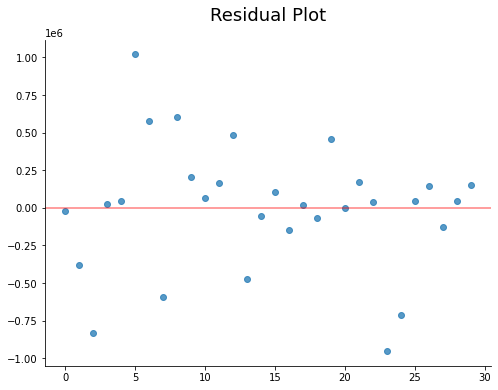

In [32]:
# Finding the residuals
plt.figure(figsize=(8,6))
residual=df['jumlah tamu total']-pred2

# Plotting the residual
plt.scatter(range(0,30),residual,alpha=0.75)
plt.axhline(0,c='red',alpha=0.5)

# Plot settings
plt.title('Residual Plot',fontsize=18,y=1.04)
sns.despine()
plt.show()

Garis merah melambangkan titik dimana nilai $y=0$. Kita dapat melihat bahwa tidak ada pola definitif dari residu yang kita dapat, sehingga memenuhi salah satu asumsi dari OLS.

### 5.E. Normal *Quantile-Quantile* Plot untuk Residu
Salah satu asumsi dari OLS adalah residu yang dimiliki akan berdistribusi normal. Asumsi ini merupakan asumsi yang bisa bersifat opsional, namun ada baiknya bagi kita untuk mengecek apabila residu yang dimiliki bersifat normal. Pengecekan tersebut dapat dilakukan menggunakan QQ-plot seperti di yang telah dilakukan di bagian **3.C**.

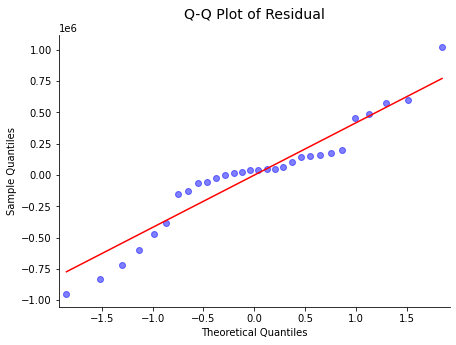

In [33]:
# Plotting a qqplot
fig, (ax1) = plt.subplots(1,1,figsize=(7,5))
sm.qqplot(residual,line='s',ax=ax1,alpha=0.5)

# Plot settings
plt.title('Q-Q Plot of Residual',fontsize=14,y=1.04)
sns.despine()

Kita bisa melihat dari QQ-plot di atas bahwa distribusi residu kita menyerupai distribusi normal namun memiliki ekor yang sedikit lebih besar diujung-ujung distribusi (disebut juga *fat-tailed*). Karena asumsi OLS ini bersifat opsional, model ini tetap masih bisa digunakan.

### 5.F. Tabel Anova
Kita dapat menggunakan tabel anova untuk melakukan tes hipotesis yaitu test F parsial. Kita dapat melihat $Pr(>F)$ atau *P-Value* dan memabndingkannya dengan nilai $\alpha=0.05$. Apabila *P-Value* lebih kecil dari $\alpha$ kita dapat mengetahui bahwa variabel tersebut memberikan kontribusi signifikan terhadap model.

In [34]:
# Importing a function to do OLS
from statsmodels.formula.api import ols

# Creating an OLS model
mod = ols('Q("jumlah tamu total") ~ Q("jumlah tempat tidur")+Q("jumlah perjalanan wisatawan nusantara")',
                data=df).fit()

# Printing the anova table
aov_table = sm.stats.anova_lm(mod)
aov_table

,df,sum_sq,mean_sq,F,PR(>F)
"Q(""jumlah tempat tidur"")",1.0,1.748472e+14,1.748472e+14,904.281587,2.685329e-22
"Q(""jumlah perjalanan wisatawan nusantara"")",1.0,1.503166e+12,1.503166e+12,7.774132,9.590953e-03
Residual,27.0,5.220581e+12,1.933549e+11,NaN,NaN


## 6. Kesimpulan
Dari data yang kita miliki, kita dapat memodelkan `jumlah tamu total` dari hotel bintang di sebuah provinsi dengan persamaan sebagai berikut:
$$\hat{y}=	1521994.3430552406	+ 1620436.3509497817* x_1 + 373703.7081082469	* x_2$$

Dimana $x_1$ adalah `jumlah tempat tidur` dan $x_2$ adalah `jumlah perjalanan wisatawan nusantara`.

Model yang dihasilkan sudah memperhitungkan nilai *Variance Inflation Factor* dan juga signifikansi parameter melalui $P>|t|$ atau *P-Value* dengan cara mengeliminasi kolom yang memiliki $VIF>5$ dan $P-Value>0.05$. Eliminasi kolom akan menurunkan beberapa metrik namun menghasilkan model yang lebih representatif terhadap populasi.

## Referensi
 - [7 Classical Assumptions of Ordinary Least Squares (OLS) Linear Regression](https://www.datasciencecentral.com/profiles/blogs/7-classical-assumptions-of-ordinary-least-squares-ols-linear)
 - [How to Perform a Durbin-Watson Test in Python](https://www.statology.org/durbin-watson-test-python/)
 - [Interpreting Linear Regression Through statsmodels .summary()](https://medium.com/swlh/interpreting-linear-regression-through-statsmodels-summary-4796d359035a)
 -  [Interpreting Results from Linear Regression - Is the Data Appropriate?](https://www.accelebrate.com/blog/interpreting-results-from-linear-regression-is-the-data-appropriate)
 - [Variance Inflation Factor (VIF) Explained](https://etav.github.io/python/vif_factor_python.html)
 - [QQ-Plot – R Base Graphs](https://environmentallearning.wordpress.com/2019/02/04/qq-plot-r-base-graphs/)
 - [qqplot (Quantile-Quantile Plot) in Python](https://www.geeksforgeeks.org/qqplot-quantile-quantile-plot-in-python/)

## Sumber Data
- [Jumlah Perjalanan Wisatawan Nusantara (Orang)](https://www.bps.go.id/indicator/16/1189/1/jumlah-perjalanan-wisatawan-nusantara.html)
- [Jumlah Tamu Asing pada Hotel Bintang (Ribu Orang)](https://www.bps.go.id/indicator/16/310/1/jumlah-tamu-asing-pada-hotel-bintang.html)
- [Jumlah Tamu Indonesia pada Hotel Bintang (Ribu Orang)](https://www.bps.go.id/indicator/16/328/1/jumlah-tamu-indonesia-pada-hotel-bintang.html)
- [Jumlah Tempat Tidur, Kamar Tidur, dan Akomodasi Hotel Bintang](https://www.bps.go.id/indicator/16/307/1/jumlah-akomodasi-kamar-dan-tempat-tidur-yang-tersedia-pada-hotel-bintang.html)
- [Kepadatan Penduduk menurut Provinsi (jiwa/km2)](https://www.bps.go.id/indicator/12/141/1/kepadatan-penduduk-menurut-provinsi.html)
- [Rata-rata Lama Menginap Tamu pada Hotel Bintang (Malam)](https://www.bps.go.id/indicator/16/362/1/rata-rata-lama-menginap-tamu-pada-hotel-bintang-menurut-provinsi.html)
- [Tingkat Penghunian Kamar pada Hotel Bintang Menurut Provinsi (Persen)](https://www.bps.go.id/indicator/16/643/2/tingkat-penghunian-kamar-pada-hotel-bintang-menurut-provinsi.html)


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=9c3ee493-8f9f-4336-beef-b362680e52c0' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>